# Uso de técnicas de segmentación clásicas

_Referencia:_ [Making Sense of Amazon Deforestation Patterns, NASA Earth Observatory](https://earthobservatory.nasa.gov/images/145888/making-sense-of-amazon-deforestation-patterns)

# Dependencias

In [ ]:
import cv2
import imageio
import numpy as np
import pandas as pd
from tabulate import tabulate
import matplotlib.pyplot as plt
from IPython.display import Image
from skimage.color import rgb2gray
from sklearn.cluster import KMeans
from skimage import filters, morphology
from IPython.display import display, HTML
from skimage.exposure import equalize_hist
from skimage.filters import threshold_local

# Carga de la imagen

In [ ]:
gif_path = '/content/deforestacion.gif'
imagenes = [img[..., :3] if img.shape[-1] == 4 else img for img in imageio.mimread(gif_path)]
imagenes_gris = [rgb2gray(img) for img in imagenes]

# Mejora del contraste

In [ ]:
imagenes_eq = [equalize_hist(img) for img in imagenes_gris]

# Segmentación de la imágen haciendo uso de diferentes métodos

## Método de OTSU

In [ ]:
umbral_otsu = [filters.threshold_otsu(img) for img in imagenes_eq]
segmentadas_otsu = [(img > umbral).astype(np.uint8) for img, umbral in zip(imagenes_eq, umbral_otsu)]

## Segmentación adaptativa

In [ ]:
umbral_adaptativo = [threshold_local(img, block_size=15, offset=0) for img in imagenes_eq]
segmentadas_adaptativas = [(img > umbral).astype(np.uint8) for img, umbral in zip(imagenes_eq, umbral_adaptativo)]

## Umbral adaptativo

In [ ]:
imagenes_eq_uint8 = [(img * 255).astype(np.uint8) for img in imagenes_eq]
segmentadas_umbral_adaptativo = [cv2.adaptiveThreshold(img, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 11, 2) for img in imagenes_eq_uint8]

## Segmentación por K-Means

In [ ]:
def segmentacion_kmeans(img, n_clusters=2):
    img_reshaped = img.reshape((-1, 1))
    kmeans = KMeans(n_clusters=n_clusters, random_state=0, n_init=10).fit(img_reshaped)
    segmented_img = kmeans.labels_.reshape(img.shape[:2])
    cluster_0_count = np.sum(segmented_img == 0)
    cluster_1_count = np.sum(segmented_img == 1)
    if cluster_0_count > cluster_1_count:
        segmented_img = 1 - segmented_img
    segmented_img = 1 - segmented_img
    return segmented_img.astype(np.uint8)

segmentadas_kmeans = [segmentacion_kmeans(img) for img in imagenes_gris]

# Refinamiento de la segmentación haciendo uso de operaciones morfológicas

In [ ]:
segmentadas_ref_otsu = [morphology.remove_small_objects(img.astype(bool), 100).astype(np.uint8) for img in segmentadas_otsu]
segmentadas_ref_adaptativas = [morphology.remove_small_objects(img.astype(bool), 100).astype(np.uint8) for img in segmentadas_adaptativas]
segmentadas_ref_umbral_adaptativo = [morphology.remove_small_objects(img.astype(bool), 100).astype(np.uint8) for img in segmentadas_umbral_adaptativo]
segmentadas_ref_kmeans = [morphology.remove_small_objects(img.astype(bool), 100).astype(np.uint8) for img in segmentadas_kmeans]

# Calculo del área de deforestación

In [ ]:
factor_escala = (20 / 51) ** 2
areas_deforestadas_otsu = [np.sum(img) * factor_escala for img in segmentadas_ref_otsu]
areas_deforestadas_adaptativas = [np.sum(img) * factor_escala for img in segmentadas_ref_adaptativas]
areas_deforestadas_umbral = [np.sum(img) * factor_escala for img in segmentadas_ref_umbral_adaptativo]
areas_deforestadas_kmeans = [np.sum(img) * factor_escala for img in segmentadas_ref_kmeans]

# Evolución del área de deforestación para cada método utilizado

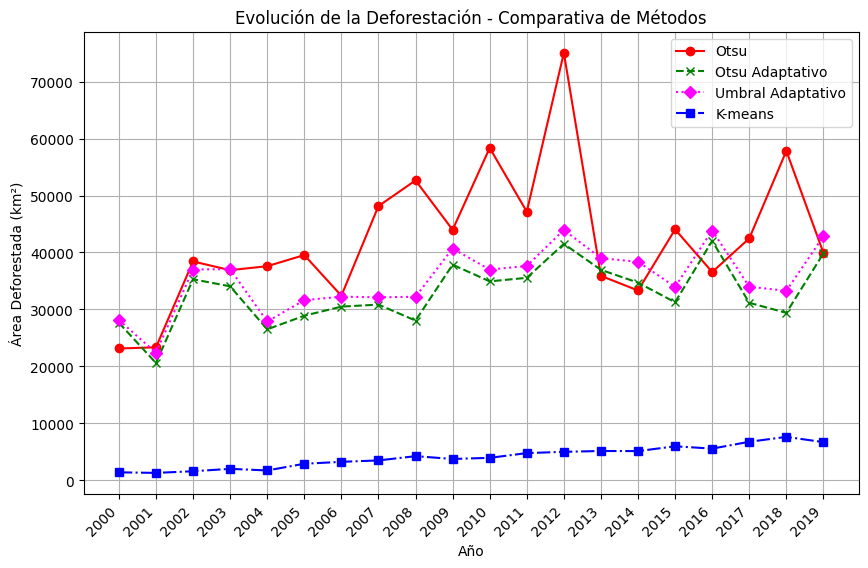

In [ ]:
years = list(range(2000, 2020))
plt.figure(figsize=(10, 6))
plt.plot(years, areas_deforestadas_otsu, marker='o', linestyle='-', color='red', label='Otsu')
plt.plot(years, areas_deforestadas_adaptativas, marker='x', linestyle='--', color='green', label='Otsu Adaptativo')
plt.plot(years, areas_deforestadas_umbral, marker='D', linestyle=':', color='magenta', label='Umbral Adaptativo')
plt.plot(years, areas_deforestadas_kmeans, marker='s', linestyle='-.', color='blue', label='K-means')
plt.xlabel('Año')
plt.ylabel('Área Deforestada (km²)')
plt.title('Evolución de la Deforestación - Comparativa de Métodos')
plt.xticks(years, rotation=45, ha='right')
plt.legend()
plt.grid()
plt.show()

# Porcentaje de incremento de la deforestación por metodo y por año

In [ ]:
df_resultados = pd.DataFrame({
    "Método": ["Otsu", "Otsu Adaptativo", "Umbral Adaptativo", "K-Means"],
    "Área Inicial (km²)": [
        areas_deforestadas_otsu[0],
        areas_deforestadas_adaptativas[0],
        areas_deforestadas_umbral[0],
        areas_deforestadas_kmeans[0]
    ],
    "Área Final (km²)": [
        areas_deforestadas_otsu[-1],
        areas_deforestadas_adaptativas[-1],
        areas_deforestadas_umbral[-1],
        areas_deforestadas_kmeans[-1]
    ],
    "Incremento (%)": [
        ((areas_deforestadas_otsu[-1] - areas_deforestadas_otsu[0]) / areas_deforestadas_otsu[0]) * 100,
        ((areas_deforestadas_adaptativas[-1] - areas_deforestadas_adaptativas[0]) / areas_deforestadas_adaptativas[0]) * 100,
        ((areas_deforestadas_umbral[-1] - areas_deforestadas_umbral[0]) / areas_deforestadas_umbral[0]) * 100,
        ((areas_deforestadas_kmeans[-1] - areas_deforestadas_kmeans[0]) / areas_deforestadas_kmeans[0]) * 100
    ]
})
print(tabulate(df_resultados, headers="keys", tablefmt="grid", floatfmt=".2f", stralign="center", numalign="center", showindex=False))

+-------------------+----------------------+--------------------+------------------+
|      Método       |  Área Inicial (km²)  |  Área Final (km²)  |  Incremento (%)  |
+===================+======================+====================+==================+
|       Otsu        |       23149.56       |      39924.49      |      72.46       |
+-------------------+----------------------+--------------------+------------------+
|  Otsu Adaptativo  |       27653.52       |      39846.98      |      44.09       |
+-------------------+----------------------+--------------------+------------------+
| Umbral Adaptativo |       28141.18       |      42838.14      |      52.23       |
+-------------------+----------------------+--------------------+------------------+
|      K-Means      |       1405.31        |      6710.50       |      377.51      |
+-------------------+----------------------+--------------------+------------------+


# Muestra de los resultados

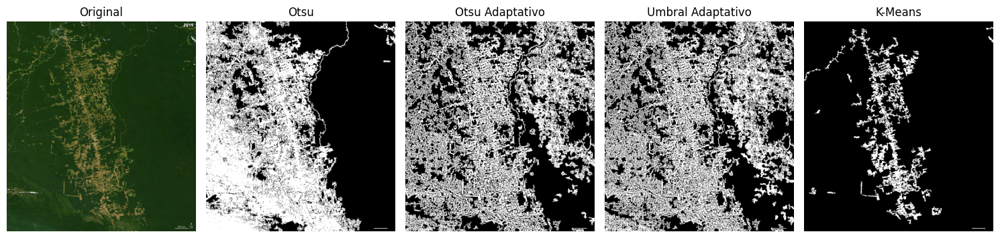

In [ ]:
fig, axes = plt.subplots(1, 5, figsize=(15, 5))
axes[0].imshow(imagenes[-1])
axes[0].set_title("Original")
axes[0].axis("off")
axes[1].imshow(segmentadas_ref_otsu[-1], cmap='gray')
axes[1].set_title("Otsu")
axes[1].axis("off")
axes[2].imshow(segmentadas_ref_adaptativas[-1], cmap='gray')
axes[2].set_title("Otsu Adaptativo")
axes[2].axis("off")
axes[3].imshow(segmentadas_ref_umbral_adaptativo[-1], cmap='gray')
axes[3].set_title("Umbral Adaptativo")
axes[3].axis("off")
axes[4].imshow(segmentadas_ref_kmeans[-1], cmap='gray')
axes[4].set_title("K-Means")
axes[4].axis("off")
plt.tight_layout()
plt.show()

# Muestra cualitativa de los resultados de cada método

In [ ]:
imageio.mimsave('/content/segmentacion_otsu.gif', [img * 255 for img in segmentadas_ref_otsu], duration=10.0)
imageio.mimsave('/content/segmentacion_otsu_adaptativo.gif', [img * 255 for img in segmentadas_ref_adaptativas], duration=10.0)
imageio.mimsave('/content/segmentacion_umbral_adaptativo.gif', [img * 255 for img in segmentadas_ref_umbral_adaptativo], duration=10.0)
imageio.mimsave('/content/segmentacion_kmeans.gif', [img * 255 for img in segmentadas_ref_kmeans], duration=10.0)

# Resultados

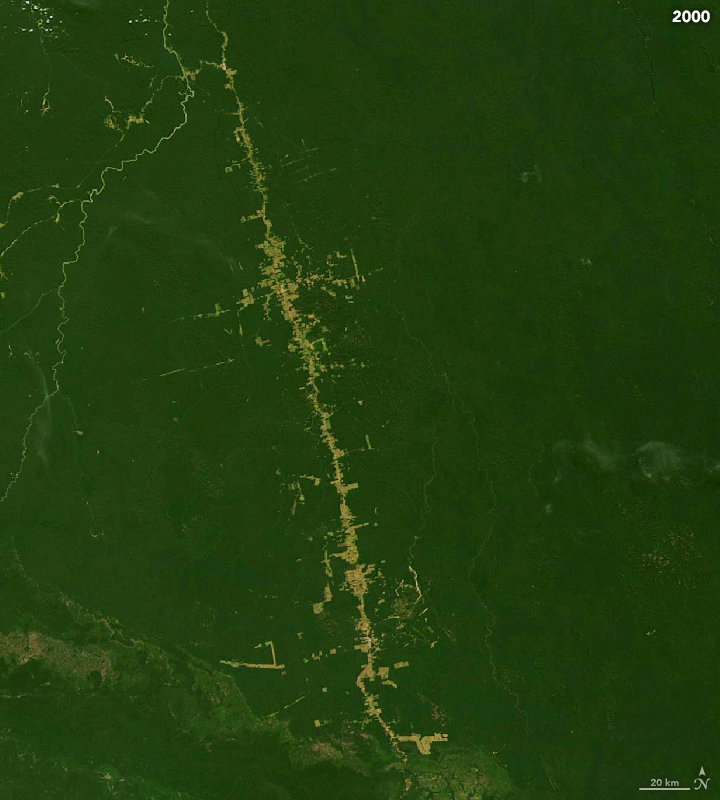

In [ ]:
Image(filename='/content/deforestacion.gif')

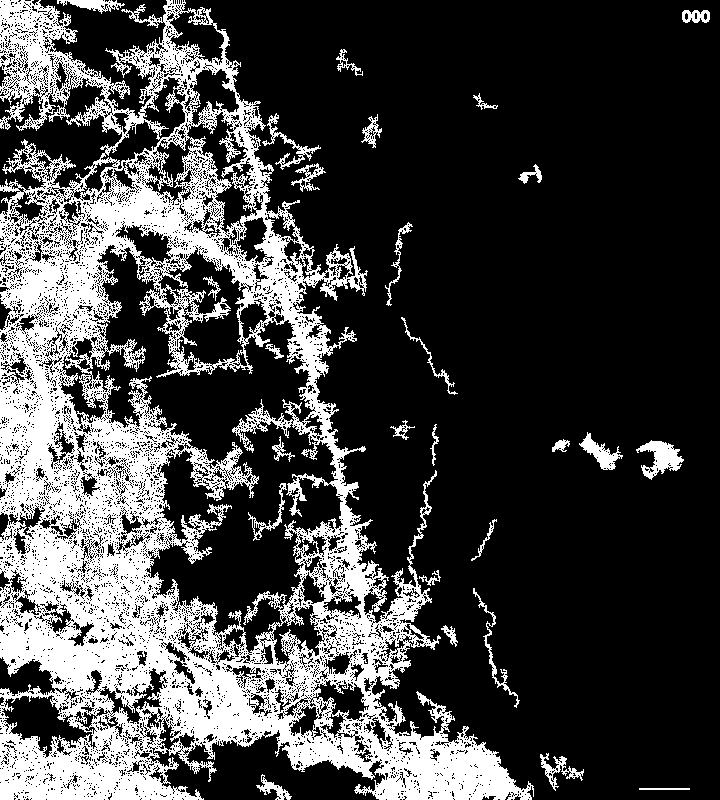

In [ ]:
Image(filename='/content/segmentacion_otsu.gif')

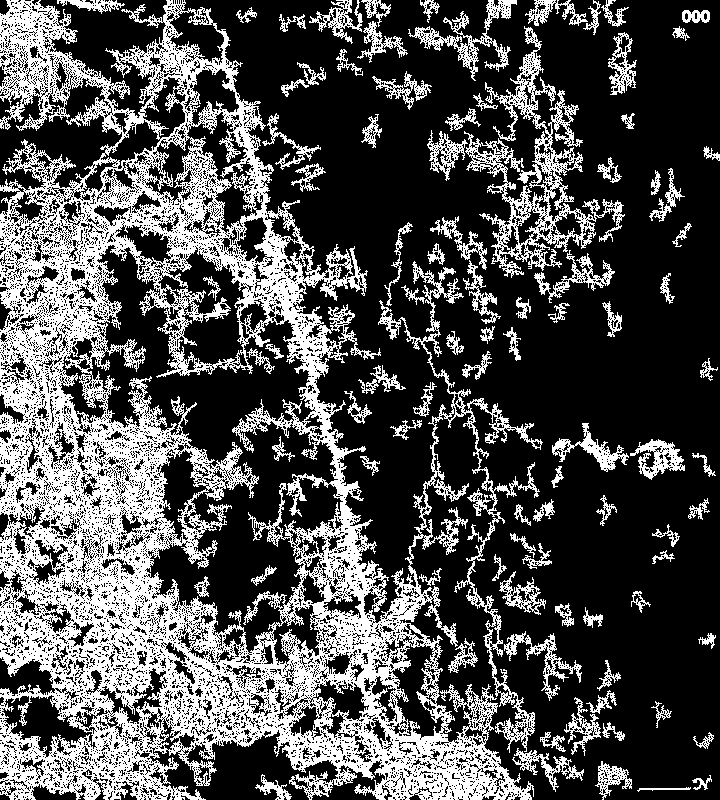

In [ ]:
Image(filename='/content/segmentacion_otsu_adaptativo.gif')

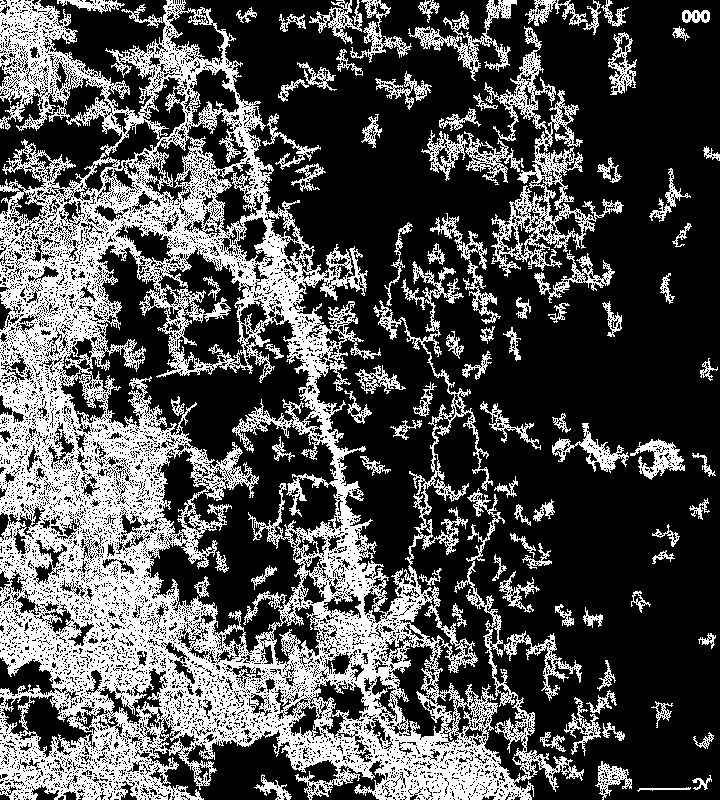

In [ ]:
Image(filename='/content/segmentacion_umbral_adaptativo.gif')

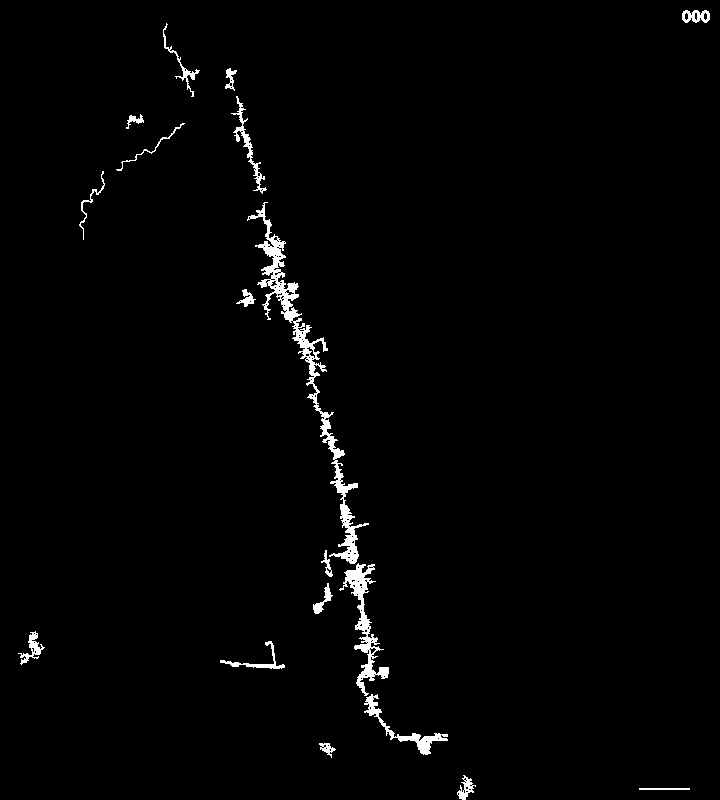

In [ ]:
Image(filename='/content/segmentacion_kmeans.gif')